In [11]:
# Python 2 & 3 Compatibility
from __future__ import print_function, division

# Necessary imports
import pandas as pd
import numpy as np
import statsmodels.api as sm
import statsmodels.formula.api as smf
import patsy
import pickle
import diagnostic_plots
import datetime


import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import RidgeCV
from sklearn.cross_validation import train_test_split
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline
from sklearn.cross_validation import KFold
from sklearn.cross_validation import cross_val_score
from sklearn import feature_selection as f_select
from sklearn.metrics import mean_squared_error
from sklearn import preprocessing
from copy import deepcopy
from fancyimpute import MICE as MICE
from sklearn.cross_validation import KFold
from sklearn.linear_model import Lasso

%matplotlib inline
%config InlineBackend.figure_format = 'svg';

In [3]:
with open('./data/processed/reduced_df2.pkl', 'rb') as picklefile:
    reduced_df2 = pickle.load(picklefile)

In [4]:
y = reduced_df2['price']
X = reduced_df2.drop(('price'), axis = 1, inplace = False)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=666)

## Impute the missing data

In [5]:
def standardize_na(df, cols, navalues):
    for col in cols:
        for navalue in navalues:
            df.loc[df[col] == navalue, col] = np.nan
        df[col] = df[col].astype(float)
        #df.loc[df[col] == '123456789.0', col] = np.nan
    return df

In [6]:
col_to_clean = ['city', 'highway', 'engine', 'cylinder', 'horsepower', 'torque']
na_values = ['N/A', '0']

X_train = standardize_na(X_train, col_to_clean, na_values)
X_train_imputed = pd.DataFrame(data = MICE().complete(X_train.as_matrix()), columns=X_train.columns, index=X_train.index);

/Users/songlin/anaconda2/envs/Python35/lib/python3.5/site-packages/pandas/core/indexing.py:537: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s
/Users/songlin/anaconda2/envs/Python35/lib/python3.5/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """


[MICE] Completing matrix with shape (1614, 63)
[MICE] Starting imputation round 1/110, elapsed time 0.003
[MICE] Starting imputation round 2/110, elapsed time 0.135
[MICE] Starting imputation round 3/110, elapsed time 0.144
[MICE] Starting imputation round 4/110, elapsed time 0.153
[MICE] Starting imputation round 5/110, elapsed time 0.163
[MICE] Starting imputation round 6/110, elapsed time 0.177
[MICE] Starting imputation round 7/110, elapsed time 0.189
[MICE] Starting imputation round 8/110, elapsed time 0.216
[MICE] Starting imputation round 9/110, elapsed time 0.232
[MICE] Starting imputation round 10/110, elapsed time 0.245
[MICE] Starting imputation round 11/110, elapsed time 0.258
[MICE] Starting imputation round 12/110, elapsed time 0.270
[MICE] Starting imputation round 13/110, elapsed time 0.280
[MICE] Starting imputation round 14/110, elapsed time 0.291
[MICE] Starting imputation round 15/110, elapsed time 0.302
[MICE] Starting imputation round 16/110, elapsed time 0.315
[M

## Basic EDA

/Users/songlin/anaconda2/envs/Python35/lib/python3.5/site-packages/matplotlib/pyplot.py:528: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


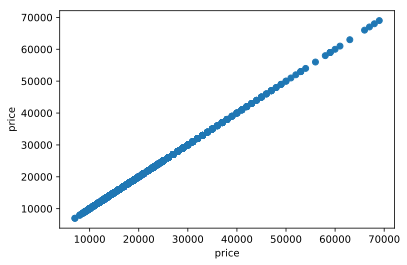

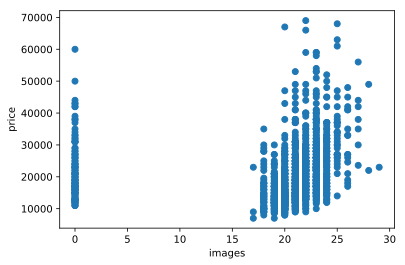

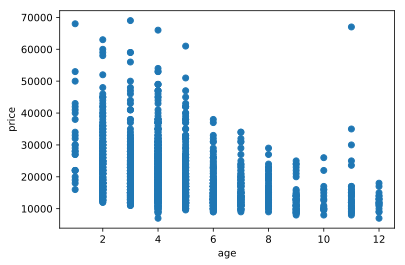

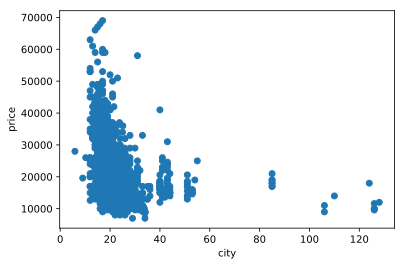

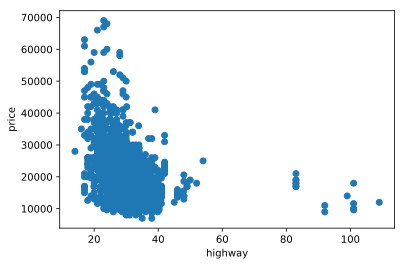

...

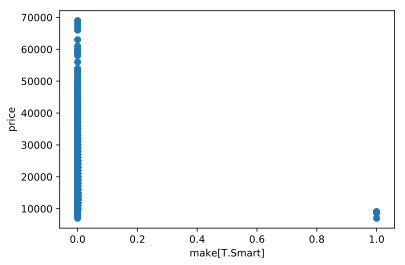

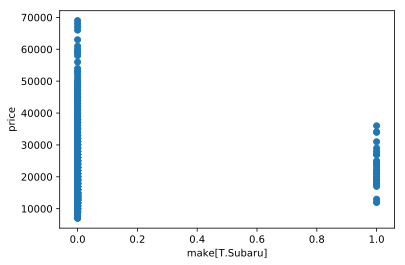

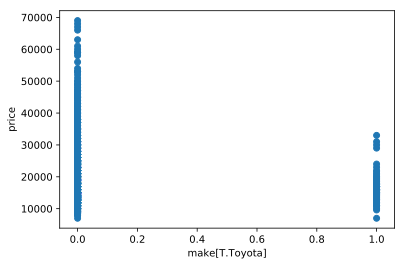

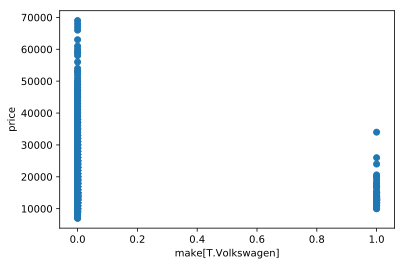

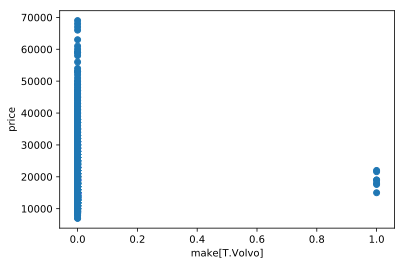

In [10]:
df_train = pd.concat((y_train, X_train_imputed), axis=1)

for col in df_train:
    plt.figure()
    ax = plt.scatter(x=df_train[col], y=y_train)
    plt.xlabel(col)
    plt.ylabel('price')

## Model 1: Baseline model with all variables

In [ ]:
kf = KFold(n=len(X_train_imputed), n_folds=5, shuffle=True, )